<a href="https://colab.research.google.com/github/vikassaini075/INSE-6220/blob/main/INSE6220Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Install Pycaret**
 

In [96]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

In [97]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

**Import Libraries**

In [207]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (11,8)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [99]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The dataset contains images of Kecimen and Besni raisin varities grown in Turkey. It contains 900 data points of raisin grans. It includes 450 pieces from both varities. From there images 8 features were extracted.

Attribute Information:

1.) Area: Gives the number of pixels within the boundaries of the raisin. 

2.) Perimeter: It measures the environment by calculating the distance between the boundaries of the raisin and the pixels around it.

3.) MajorAxisLength: Gives the length of the main axis, which is the longest line that can be drawn on the raisin.

4.) MinorAxisLength: Gives the length of the small axis, which is the shortest line that can be drawn on the raisin.

5.) Eccentricity: It gives a measure of the eccentricity of the ellipse, which has the same moments as raisins. 

6.) ConvexArea: Gives the number of pixels of the smallest convex shell of the region formed by the raisin.

7.) Extent: Gives the ratio of the region formed by the raisin to the total pixels in the bounding box.

8.) Class: Kecimen and Besni raisin.

https://archive.ics.uci.edu/ml/datasets/Raisin+Dataset

In [100]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/vikassaini075/INSE-6220/main/Raisin_Grains_Dataset-Table%201.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,Kecimen
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,Kecimen
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,Kecimen
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,Kecimen
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,Kecimen
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,Kecimen
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,Kecimen
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,Kecimen
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,Kecimen
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,Kecimen


In [101]:
#Preprocessing the data by Replacing Kecimen with 0 and Besni with 1 

df["Class"]=df["Class"].replace("Kecimen",0)
df["Class"]=df["Class"].replace("Besni",1)

In [102]:
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836,0
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796,0
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366,0
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728,0
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544,0


In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


In [104]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [105]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis** 

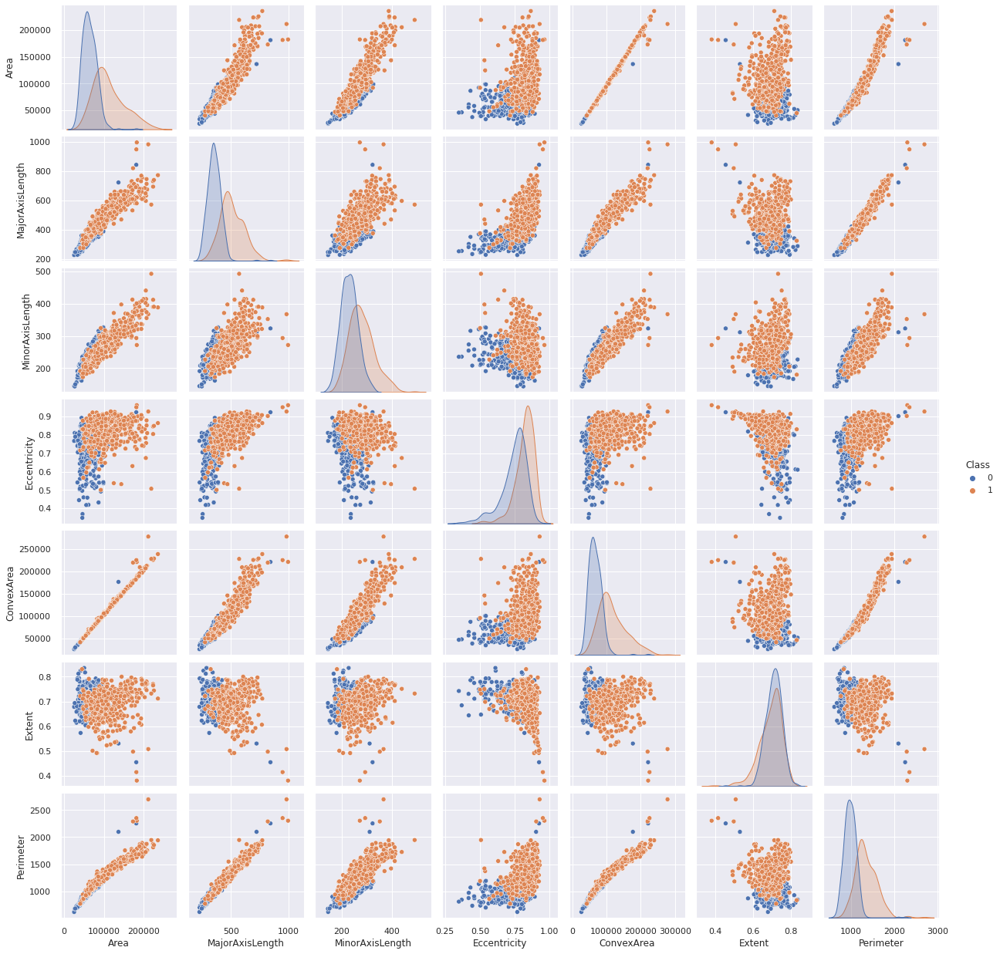

In [106]:
sns.pairplot(df, hue='Class',)
plt.show()

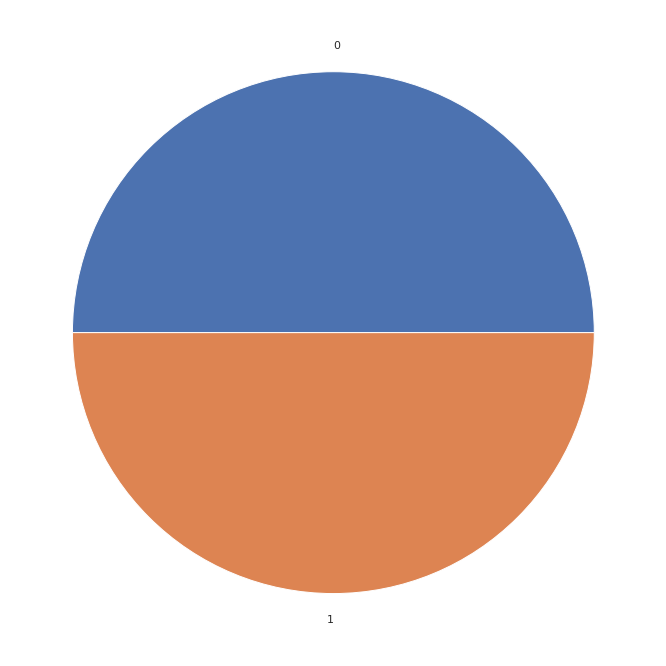

In [107]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

### **Data Matrix**

In [108]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251
5,49242,318.125407,200.122120,0.777351,51368,0.658456,881.836
6,42492,310.146072,176.131449,0.823099,43904,0.665894,823.796
7,60952,332.455472,235.429835,0.706058,62329,0.743598,933.366
8,42256,323.189607,172.575926,0.845499,44743,0.698031,849.728
9,64380,366.964842,227.771615,0.784056,66125,0.664376,981.544


In [109]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


Standardize the Data

In [110]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter
0,-0.007186,0.097577,-0.023958,0.423142,-0.015709,1.106743,0.066274
1,-0.324217,-0.209012,-0.229292,0.224476,-0.304248,-0.287777,-0.161252
2,0.078292,0.097758,0.236988,0.186239,0.062113,-1.158250,0.155945
3,-1.074286,-1.245051,-0.915273,-1.069623,-1.076165,0.001711,-1.175915
4,-0.215393,-0.678958,0.727354,-2.409827,-0.238623,1.745259,-0.338639
5,-0.989269,-0.972699,-1.088166,-0.046427,-0.977212,-0.768202,-1.038224
6,-1.162433,-1.041504,-1.568353,0.460367,-1.160393,-0.629029,-1.250349
7,-0.688862,-0.849133,-0.381463,-0.836226,-0.708208,0.825066,-0.849891
8,-1.168487,-0.929031,-1.639519,0.708518,-1.139802,-0.027639,-1.155572
9,-0.600920,-0.551563,-0.534746,0.027845,-0.615047,-0.657433,-0.673810


**Observations and variables**

In [111]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**


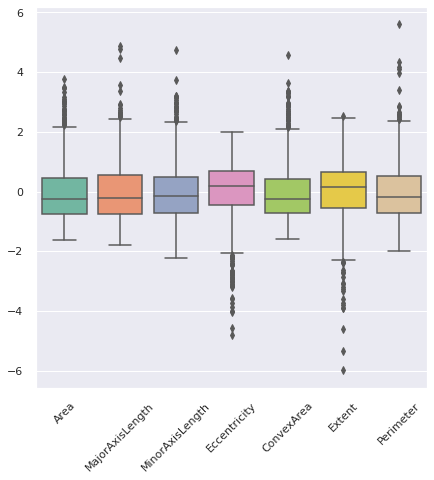

In [112]:
ax = plt.figure(figsize=(7,7))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

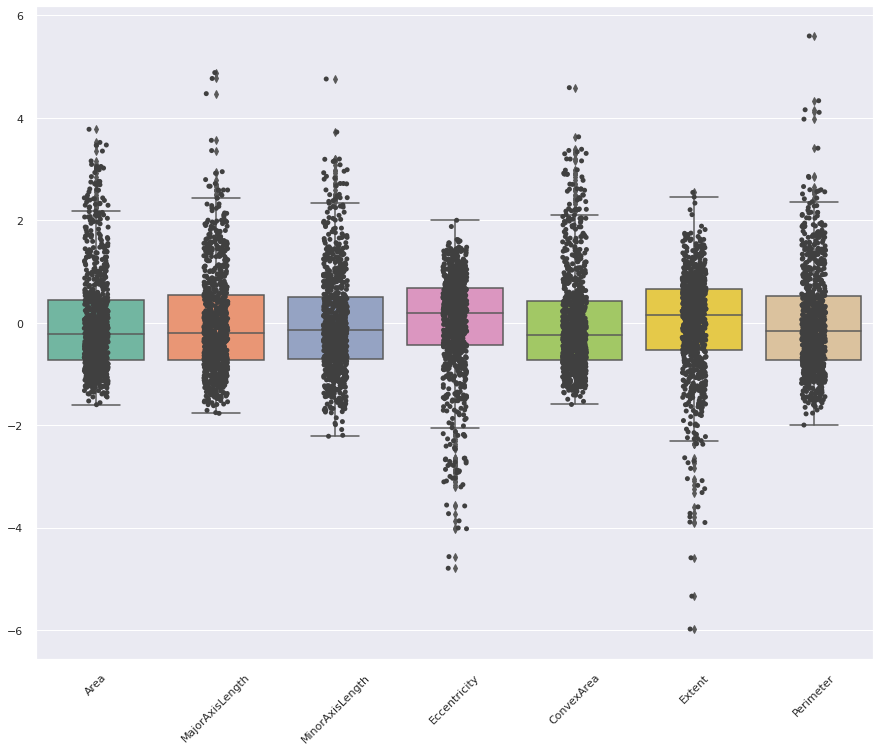

In [113]:
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

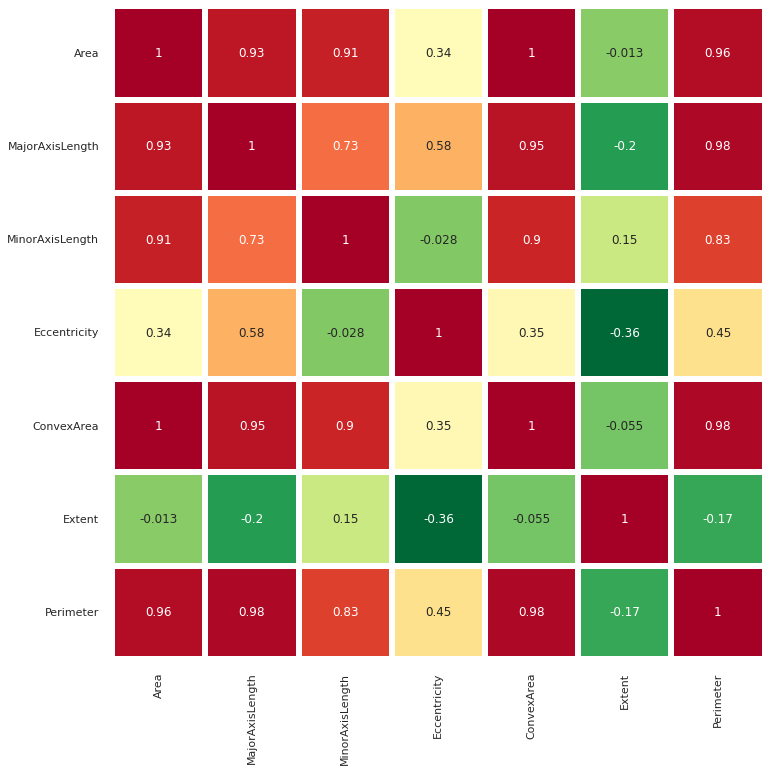

In [114]:
from IPython.core.pylabtools import figsize
from matplotlib import figure
ax = sns.heatmap(X.corr(), cmap="RdYlGn_r", linewidths=5, annot=True, cbar=False, square=True, )

plt.yticks(rotation=0,)
ax.tick_params(labelbottom=True,labeltop=False)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

### **Principal Component Analysis (PCA)**

Text(0, 0.5, 'Value: 1')

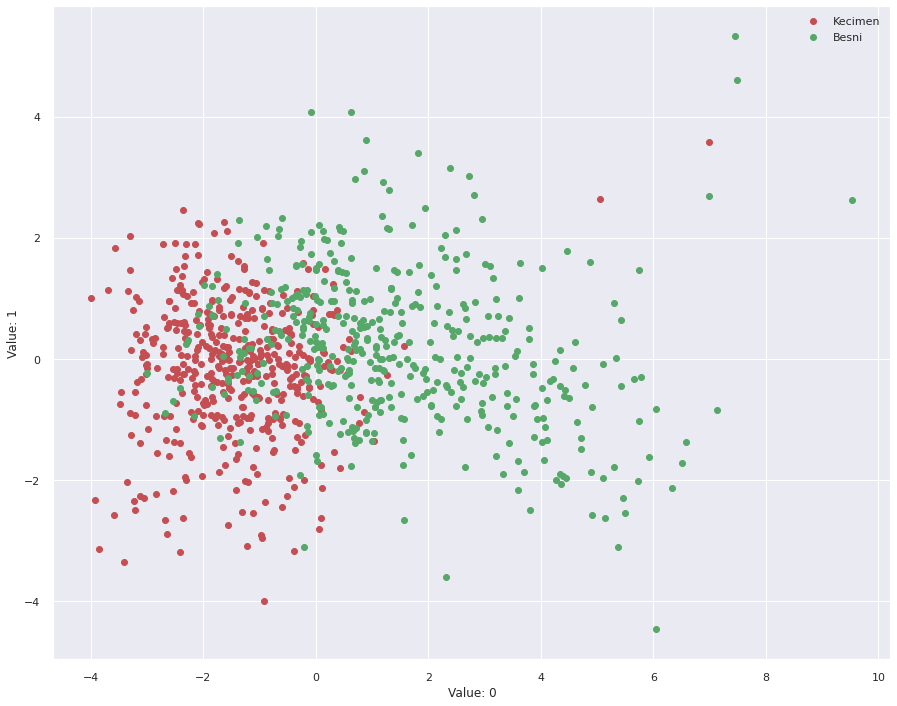

In [115]:
pca = PCA()
Z = pca.fit_transform(X)

# 1(Kecimen)->0,  2(Besni)->1
idx_Kecimen = np.where(y == 0)
idx_Besni = np.where(y == 1)
 

plt. figure()
plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='r', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='g', label='Besni')
 
plt.legend()
plt.xlabel('Value: 0')
plt.ylabel('Value: 1')

**Eigen Vectors**


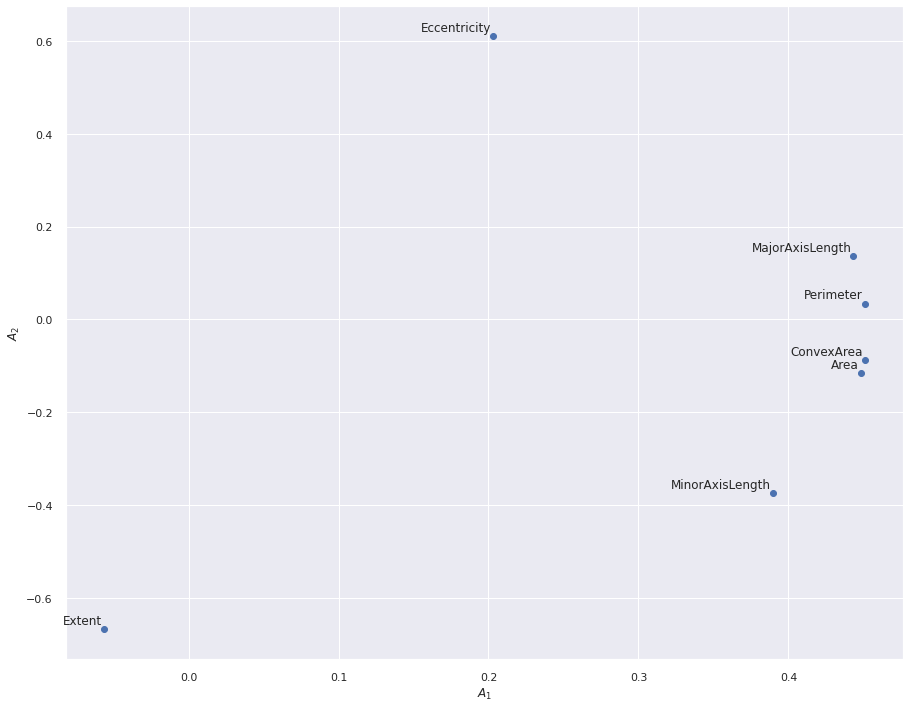

In [116]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],)
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

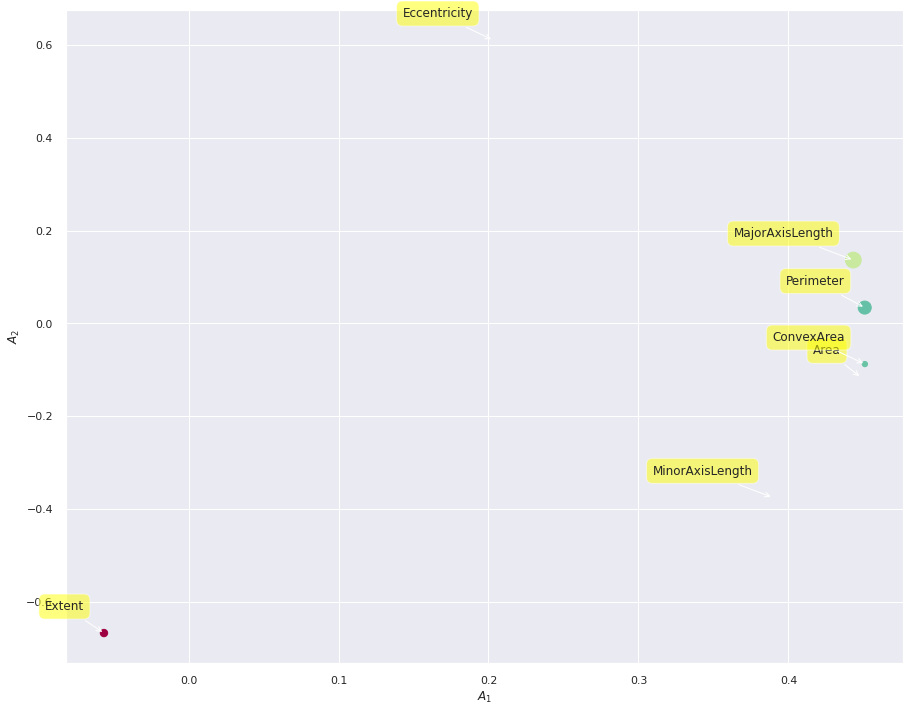

In [117]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree Plot**

Text(0, 0.5, 'Explained variance')

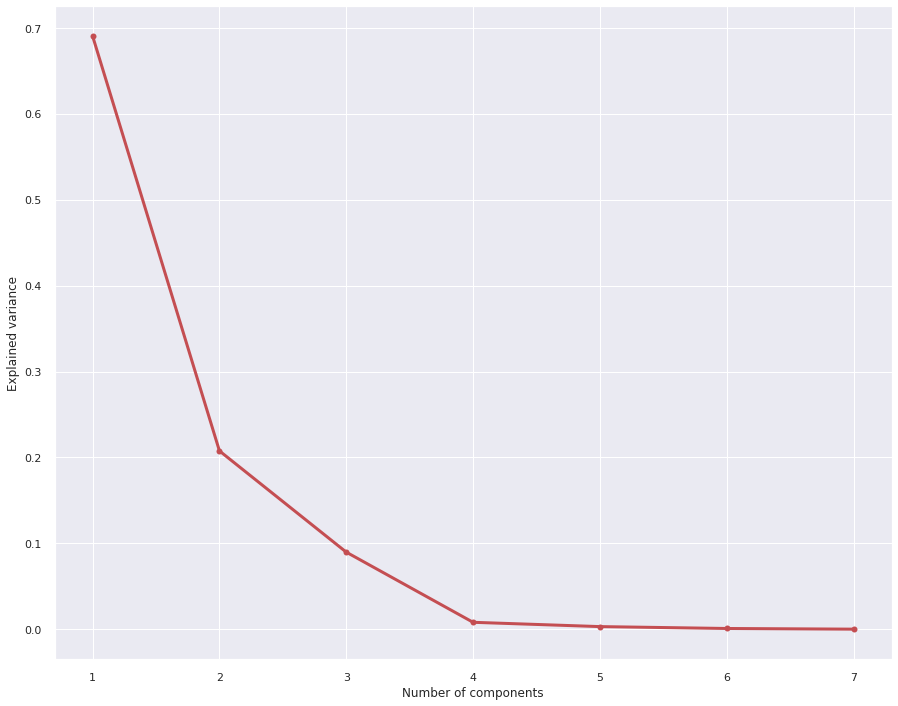

In [118]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3,)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

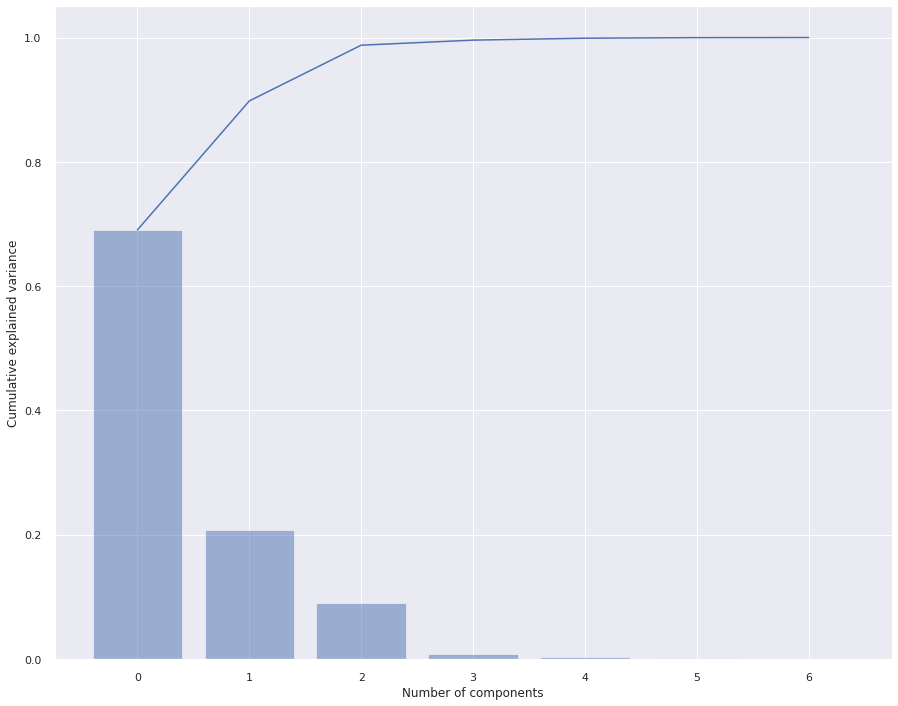

In [119]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Eigen Vector Matrix**

In [120]:
print(f'Eigenvector matrix:\n{A}')

Eigenvector matrix:
[[ 0.44828422 -0.11609991  0.00548378 -0.11113906 -0.61104765 -0.09983439
  -0.62436686]
 [ 0.4432398   0.13658724 -0.10054797  0.49520464  0.08757032 -0.68557712
   0.22772863]
 [ 0.38938118 -0.37492246  0.23604354 -0.6558767   0.38457775 -0.2390332
   0.12995283]
 [ 0.20297098  0.61082321 -0.62852206 -0.42629865  0.07510412  0.05356014
   0.02044403]
 [ 0.45093833 -0.08761633  0.0366724   0.0558117  -0.39241075  0.47120104
   0.63914127]
 [-0.05636836 -0.66734439 -0.73198093  0.10905256  0.05685884  0.02345199
  -0.00161639]
 [ 0.45082374  0.03417227  0.04430077  0.3398651   0.5551508   0.48726906
  -0.36399975]]


**Eigen Values**

In [121]:
print(f'Eigenvalues:\n{Lambda}')

Eigenvalues:
[4.83766379e+00 1.45480489e+00 6.29148522e-01 5.68877209e-02
 2.18325269e-02 6.43734371e-03 1.01163378e-03]


**Biplot**

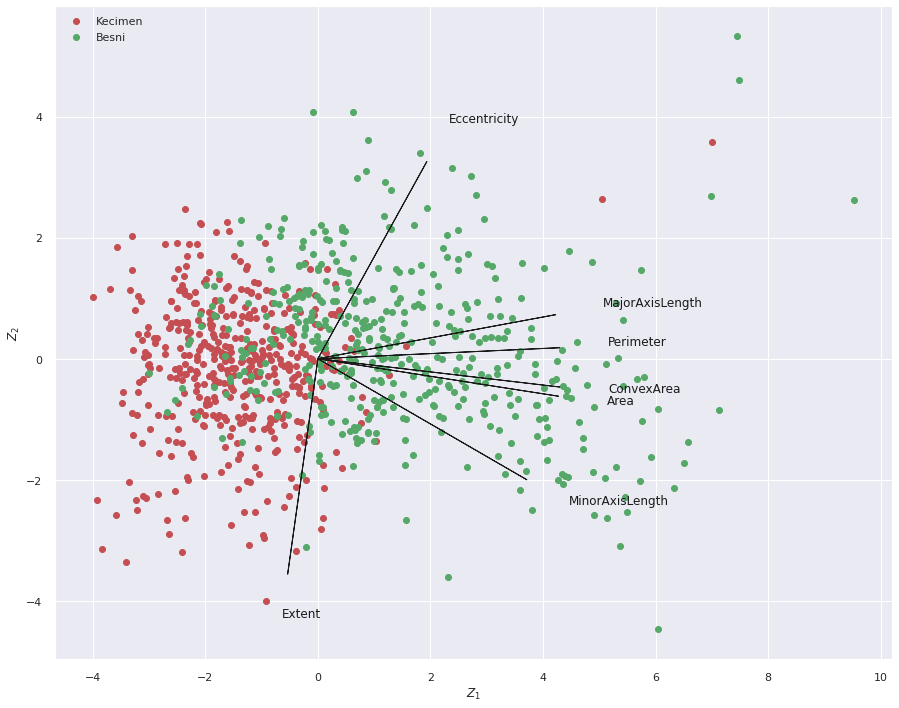

In [122]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Kecimen,0], Z[idx_Kecimen,1], c='r', label='Kecimen')
plt.scatter(Z[idx_Besni,0], Z[idx_Besni,1], c='g', label='Besni')

plt.legend(loc='upper left')

### Using PCA Library

In [123]:
!pip install pca

In [124]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


### Principal Components

In [125]:
out['PC']

,PC1,PC2,PC3
0,0.076994,-0.453328,-1.089214
1,-0.475376,0.445368,0.016372
2,0.372109,0.802008,0.786487
3,-2.622445,-0.302564,0.482721
4,-0.962054,-2.967763,0.452154
...,...,...,...
895,-0.114629,0.694645,0.129914
896,0.273577,0.953934,0.696489
897,0.682451,-1.308199,0.091732
898,0.648410,0.979248,0.091413


### Scatter plot 

(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fc8852a8250>)

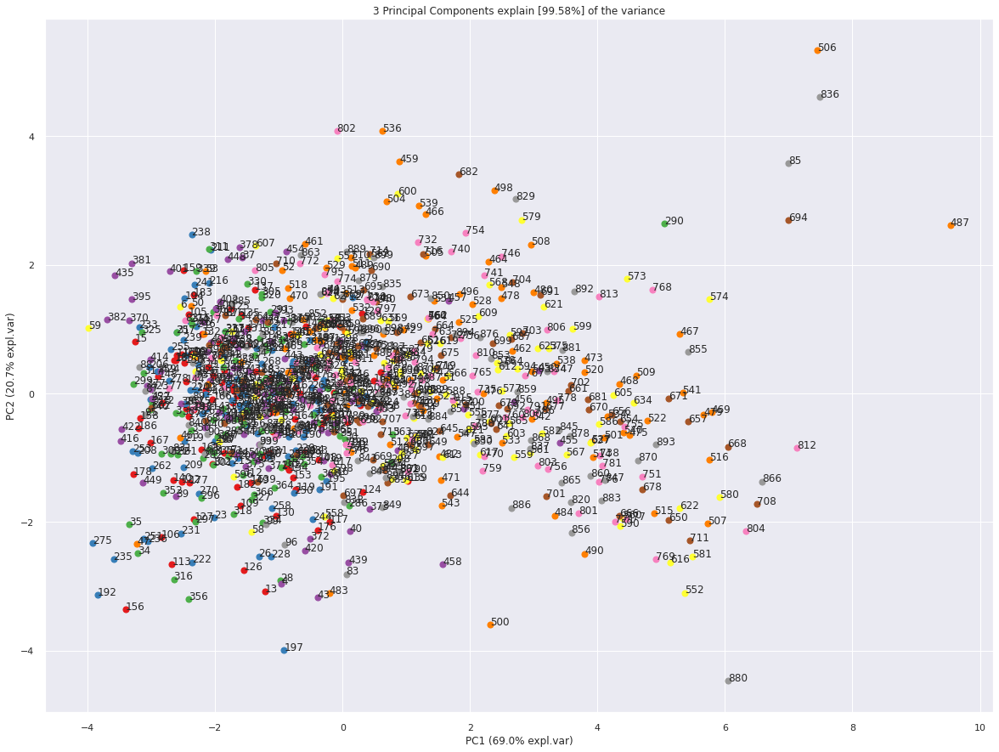

In [126]:
model.scatter(label=True, legend=False,)

### Eigenvectors

In [127]:
A = out['loadings'].T

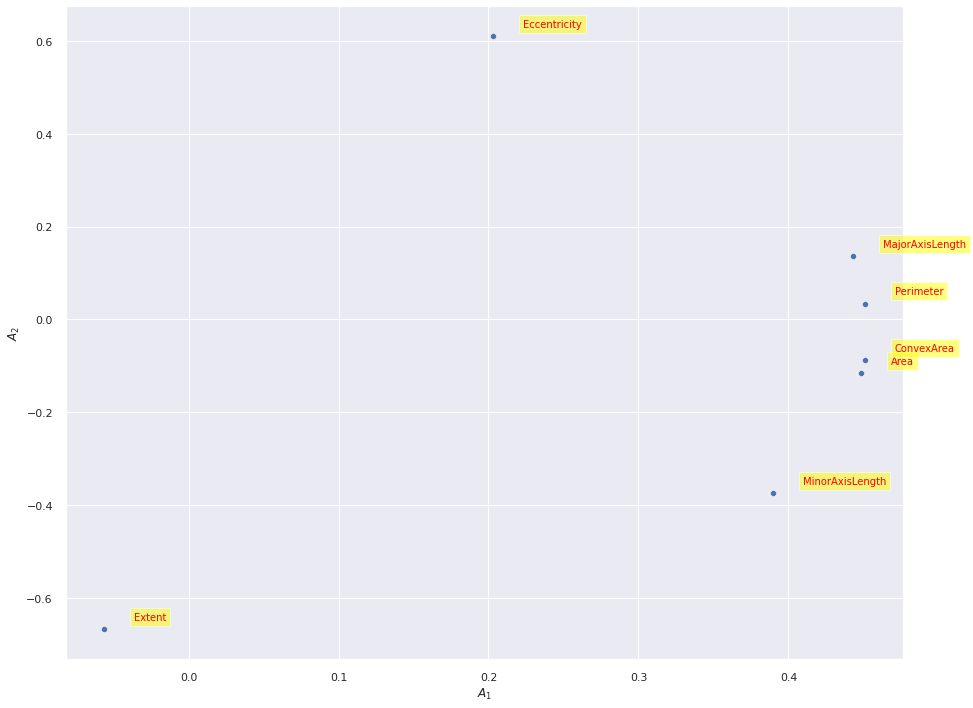

In [128]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

### Scree Plot

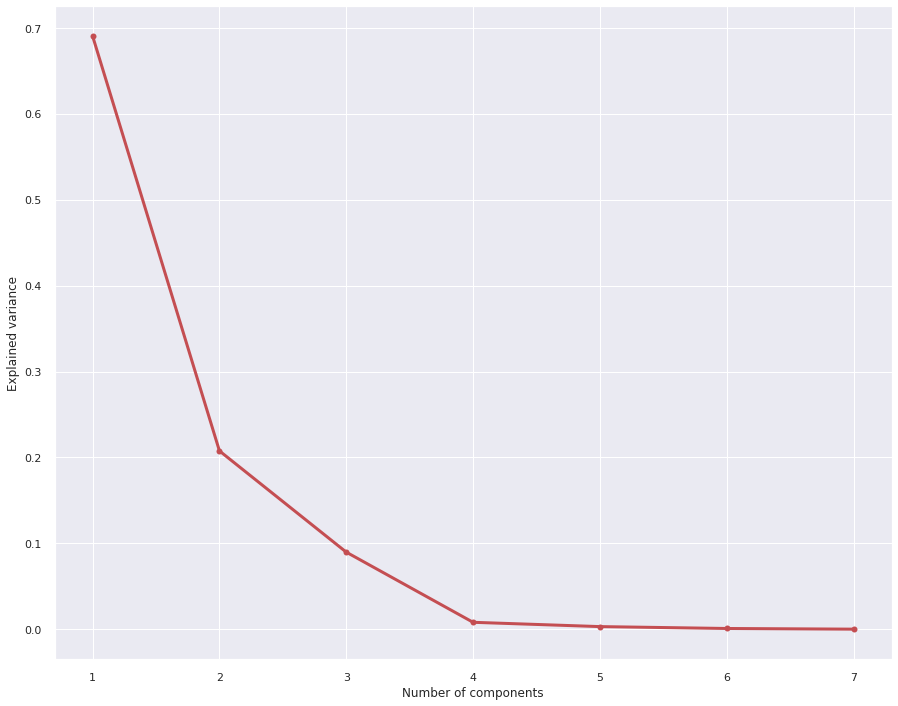

In [129]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

### Explained Variance Plot

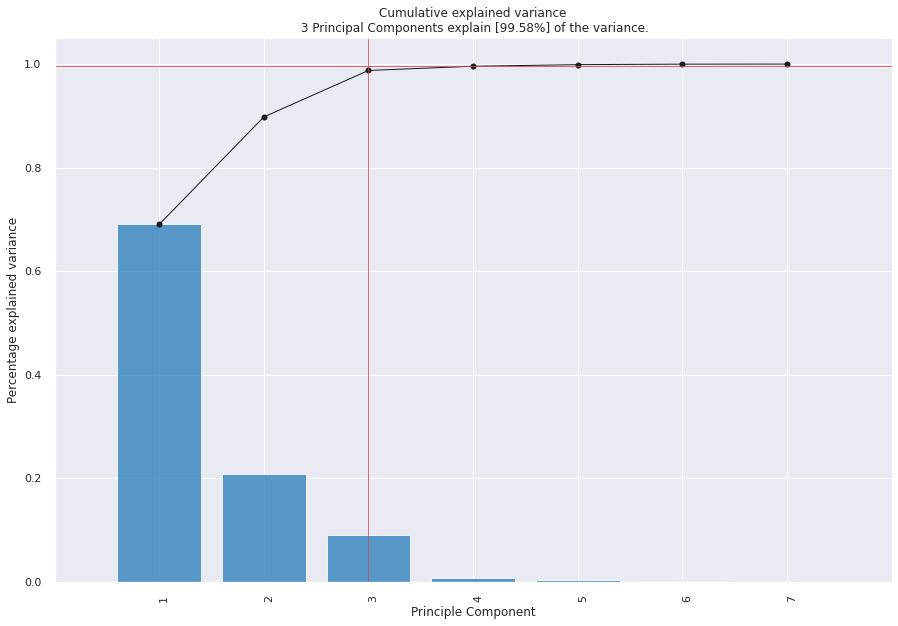

<Figure size 1080x864 with 0 Axes>

In [130]:
model.plot();

### Biplot

[pca] >Plot PC1 vs PC2 with loadings.


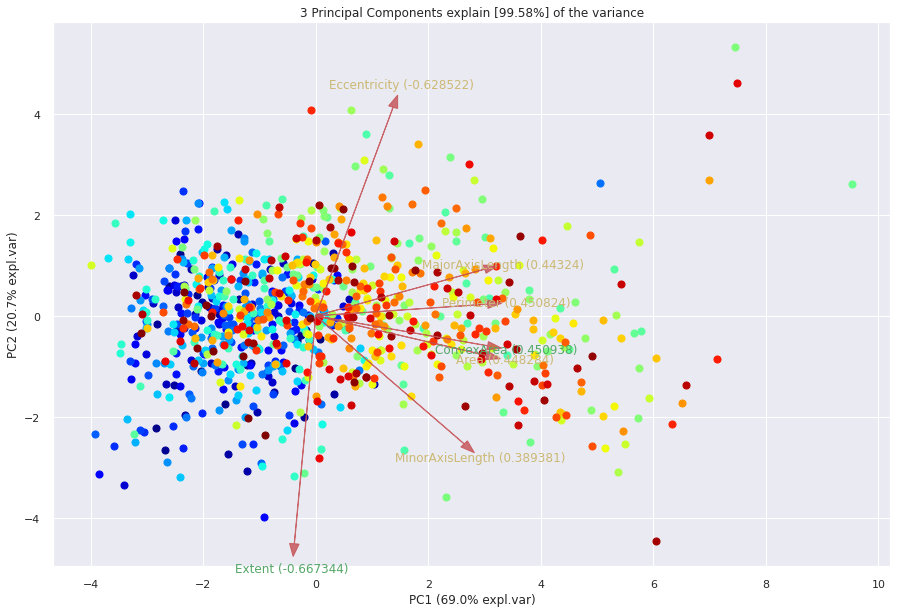

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fc8842eeb50>)

In [131]:
model.biplot(cmap='jet', label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


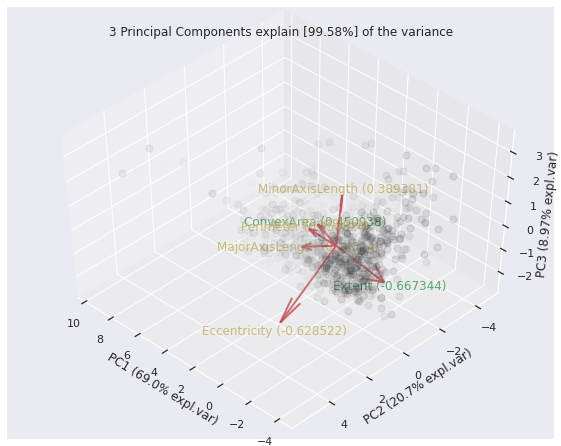

(<Figure size 576x432 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fc885ad13d0>)

In [132]:
model.biplot3d(legend=False, label=False, alpha_transparency=0.1, figsize=(8,6), cmap='gray')

### **Control Chart**

No handles with labels found to put in legend.
No handles with labels found to put in legend.


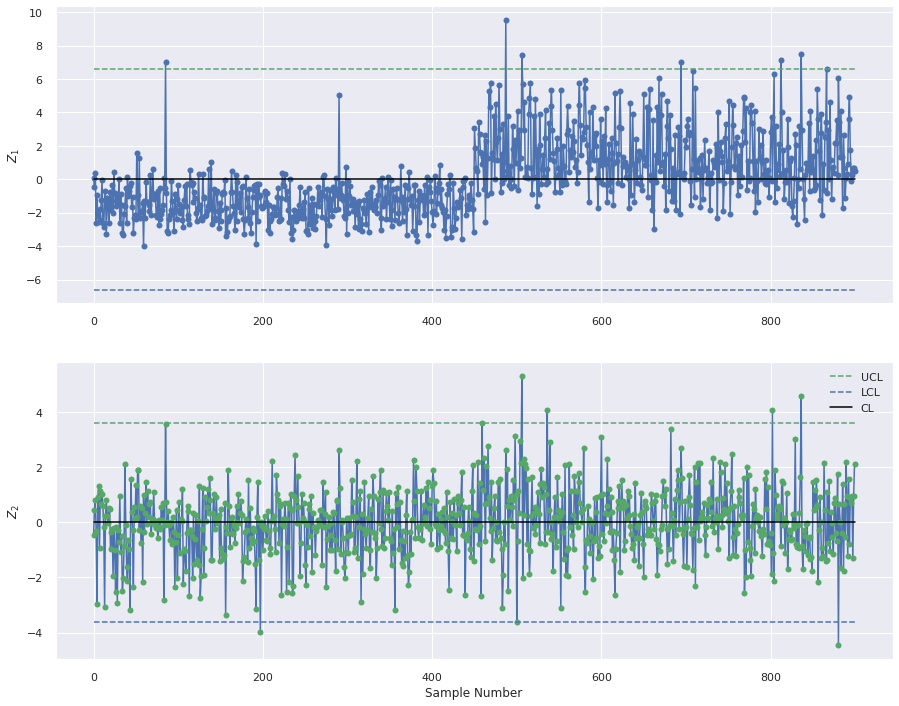

In [133]:
fig, (ax1, ax2) = plt.subplots(2,1)
ax1.plot(Z1,'-b', marker='o', mec='y',mfc='b')
ax1.plot([3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--g", label="UCL")
ax1.plot([-3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--b", label='LCL')
ax1.plot([0 for i in range(len(Z1))], "-", color='black',label='CL')
ax1.set_ylabel('$Z_1$')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))

ax2.plot(Z2,'-b', marker='o', mec='y',mfc='g')
ax2.plot([3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--g", label="UCL")
ax2.plot([-3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--b", label='LCL')
ax2.plot([0 for i in range(len(Z2))], "-", color='black',label='CL')
ax2.set_ylabel('$Z_2$')
ax2.set_xlabel('Sample Number')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))
plt.legend()

In [134]:
print(np.argwhere(Z1<-3*np.sqrt(Lambda[0])))
print(np.argwhere(Z1>3*np.sqrt(Lambda[0])))
print(np.argwhere(Z2<-3*np.sqrt(Lambda[1])))
print(np.argwhere(Z2>3*np.sqrt(Lambda[1])))

[]
[[ 85]
 [487]
 [506]
 [694]
 [812]
 [836]]
[[197]
 [880]]
[[506]
 [536]
 [802]
 [836]]


 ### **Classification**

In [135]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [136]:
data = df.sample(frac=0.9, random_state=660)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (810, 8)
Unseen Data For Predictions: (90, 8)


In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=76)

### **Comparing All Models**

In [138]:
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8622,0.9181,0.8451,0.8784,0.8598,0.7244,0.7271,0.512
ada,Ada Boost Classifier,0.8622,0.9132,0.8239,0.8975,0.8573,0.7245,0.7295,0.108
ridge,Ridge Classifier,0.8569,0.0000,0.8171,0.8926,0.8515,0.7139,0.7187,0.015
qda,Quadratic Discriminant Analysis,0.8569,0.9214,0.7783,0.9278,0.8438,0.7140,0.7260,0.016
lr,Logistic Regression,0.8568,0.9287,0.8240,0.8888,0.8526,0.7139,0.7194,0.357
lda,Linear Discriminant Analysis,0.8568,0.9206,0.8309,0.8806,0.8535,0.7137,0.7169,0.015
gbc,Gradient Boosting Classifier,0.8533,0.9208,0.8346,0.8748,0.8519,0.7068,0.7113,0.129
lightgbm,Light Gradient Boosting Machine,0.8497,0.9115,0.8272,0.8689,0.8463,0.6996,0.7021,0.172
et,Extra Trees Classifier,0.8357,0.9150,0.8169,0.8564,0.8339,0.6714,0.6753,0.557
nb,Naive Bayes,0.8216,0.9092,0.7254,0.9005,0.8008,0.6434,0.6580,0.016


### **Best Model (Random Forest Classifier)**

In [185]:
#best model random forest
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9594,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.8246,0.8670,0.7857,0.8462,0.8148,0.6486,0.6502
2,0.9298,0.9218,0.8966,0.9630,0.9286,0.8598,0.8619
3,0.7895,0.9027,0.7241,0.8400,0.7778,0.5799,0.5856
4,0.9123,0.9711,0.9310,0.9000,0.9153,0.8244,0.8249
5,0.8070,0.8559,0.6897,0.9091,0.7843,0.6156,0.6349
6,0.7857,0.8973,0.7857,0.7857,0.7857,0.5714,0.5714
7,0.8571,0.9152,0.8571,0.8571,0.8571,0.7143,0.7143
8,0.7679,0.8393,0.7857,0.7586,0.7719,0.5357,0.5361
9,0.8036,0.8622,0.7500,0.8400,0.7925,0.6071,0.6107


### **Tune best model**

In [186]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9717,0.9643,0.9000,0.9310,0.8598,0.8619
1,0.8070,0.8658,0.8214,0.7931,0.8070,0.6142,0.6145
2,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
3,0.8421,0.8966,0.7931,0.8846,0.8364,0.6847,0.6885
4,0.9123,0.9680,0.8966,0.9286,0.9123,0.8246,0.8251
5,0.8421,0.8756,0.7586,0.9167,0.8302,0.6851,0.6958
6,0.8036,0.9337,0.7857,0.8148,0.8000,0.6071,0.6075
7,0.8750,0.9375,0.8571,0.8889,0.8727,0.7500,0.7505
8,0.8036,0.8616,0.7857,0.8148,0.8000,0.6071,0.6075
9,0.8750,0.8878,0.8214,0.9200,0.8679,0.7500,0.7543


### **Evaluating Best Model**

In [187]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### **Create Ada Boost Classifier**

In [188]:
ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9723,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.8070,0.8929,0.8571,0.7742,0.8136,0.6146,0.6181
2,0.9123,0.9286,0.8621,0.9615,0.9091,0.8248,0.8294
3,0.7895,0.8282,0.7241,0.8400,0.7778,0.5799,0.5856
4,0.8246,0.9495,0.7586,0.8800,0.8148,0.6499,0.6563
5,0.8070,0.8651,0.7241,0.8750,0.7925,0.6151,0.6247
6,0.7857,0.9158,0.7857,0.7857,0.7857,0.5714,0.5714
7,0.8571,0.9120,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.7500,0.8380,0.7143,0.7692,0.7407,0.5000,0.5013
9,0.8214,0.8980,0.7857,0.8462,0.8148,0.6429,0.6445


### **Tune AdaBoost Classifier**
 



In [189]:
tuned_ada = tune_model(ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9649,0.9649,0.9643,0.9643,0.9643,0.9298,0.9298
1,0.7895,0.7894,0.7857,0.7857,0.7857,0.5788,0.5788
2,0.8772,0.8781,0.8276,0.9231,0.8727,0.7548,0.7590
3,0.8421,0.8430,0.7931,0.8846,0.8364,0.6847,0.6885
4,0.9298,0.9415,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8246,0.8264,0.7241,0.9130,0.8077,0.6503,0.6651
6,0.8393,0.8463,0.8571,0.8276,0.8421,0.6786,0.6790
7,0.8571,0.8571,0.8571,0.8571,0.8571,0.7143,0.7143
8,0.7857,0.7857,0.7500,0.8077,0.7778,0.5714,0.5729
9,0.8393,0.8393,0.8214,0.8519,0.8364,0.6786,0.6790


### **Evaluate AdaBoost Classifier**

In [190]:
evaluate_model(tuned_ada)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [143]:
!pip install statsmodels --upgrade

###**Create Ridge Classifier**

In [145]:
ridge = create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9123,0.0,0.8929,0.9259,0.9091,0.8244,0.8249
1,0.8070,0.0,0.8214,0.7931,0.8070,0.6142,0.6145
2,0.8596,0.0,0.8276,0.8889,0.8571,0.7196,0.7213
3,0.7895,0.0,0.7241,0.8400,0.7778,0.5799,0.5856
4,0.8947,0.0,0.7931,1.0000,0.8846,0.7902,0.8082
5,0.8947,0.0,0.8621,0.9259,0.8929,0.7897,0.7916
6,0.9643,0.0,0.9286,1.0000,0.9630,0.9286,0.9309
7,0.8571,0.0,0.8214,0.8846,0.8519,0.7143,0.7161
8,0.8214,0.0,0.7143,0.9091,0.8000,0.6429,0.6581
9,0.7679,0.0,0.7857,0.7586,0.7719,0.5357,0.5361


###**Tune Ridge Classifier**

In [172]:
tuned_ridge = tune_model(ridge)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.0,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.8070,0.0,0.7857,0.8148,0.8000,0.6137,0.6141
2,0.8947,0.0,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.0,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.0,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.0,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8571,0.0,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8393,0.0,0.8214,0.8519,0.8364,0.6786,0.6790
8,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
9,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825


###**Evaluate Ridge Classifier**

In [173]:
evaluate_model(tuned_ridge)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### **Create qda**
 

In [148]:
qda = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8947,0.9347,0.8214,0.9583,0.8846,0.7889,0.7968
1,0.8596,0.9200,0.8214,0.8846,0.8519,0.7189,0.7206
2,0.8772,0.9323,0.8276,0.9231,0.8727,0.7548,0.7590
3,0.8070,0.8633,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8421,0.9581,0.7241,0.9545,0.8235,0.6855,0.7069
5,0.8772,0.9421,0.8276,0.9231,0.8727,0.7548,0.7590
6,0.9107,0.9707,0.8571,0.9600,0.9057,0.8214,0.8262
7,0.8393,0.8514,0.7500,0.9130,0.8235,0.6786,0.6897
8,0.8214,0.9426,0.6429,1.0000,0.7826,0.6429,0.6882
9,0.8393,0.8992,0.8214,0.8519,0.8364,0.6786,0.6790


### **Tune qda**

In [149]:
tuned_qda = tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8947,0.9347,0.8214,0.9583,0.8846,0.7889,0.7968
1,0.8596,0.9200,0.8214,0.8846,0.8519,0.7189,0.7206
2,0.8772,0.9323,0.8276,0.9231,0.8727,0.7548,0.7590
3,0.8070,0.8633,0.6897,0.9091,0.7843,0.6156,0.6349
4,0.8421,0.9581,0.7241,0.9545,0.8235,0.6855,0.7069
5,0.8772,0.9421,0.8276,0.9231,0.8727,0.7548,0.7590
6,0.9107,0.9707,0.8571,0.9600,0.9057,0.8214,0.8262
7,0.8393,0.8514,0.7500,0.9130,0.8235,0.6786,0.6897
8,0.8214,0.9426,0.6429,1.0000,0.7826,0.6429,0.6882
9,0.8393,0.8992,0.8214,0.8519,0.8364,0.6786,0.6790


### **Evaluate qda**

In [210]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

<Figure size 792x576 with 0 Axes>

### **Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

In [158]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8603,0.9287,0.8384,0.8836,0.8574,0.7208,0.7262,0.017
ridge,Ridge Classifier,0.8603,0.0000,0.8101,0.9050,0.8527,0.7209,0.7276,0.012
lda,Linear Discriminant Analysis,0.8603,0.9291,0.8101,0.9050,0.8527,0.7209,0.7276,0.015
nb,Naive Bayes,0.8550,0.9218,0.7962,0.9061,0.8451,0.7103,0.7184,0.014
qda,Quadratic Discriminant Analysis,0.8550,0.9242,0.7996,0.9033,0.8457,0.7103,0.7181,0.014
knn,K Neighbors Classifier,0.8410,0.8926,0.8067,0.8696,0.8355,0.6822,0.6860,0.115
rf,Random Forest Classifier,0.8407,0.8992,0.8134,0.8628,0.8357,0.6816,0.6850,0.499
gbc,Gradient Boosting Classifier,0.8391,0.9166,0.7999,0.8722,0.8321,0.6786,0.6840,0.092
svm,SVM - Linear Kernel,0.8356,0.0000,0.8167,0.8558,0.8297,0.6714,0.6792,0.016
ada,Ada Boost Classifier,0.8284,0.9000,0.7962,0.8545,0.8229,0.6572,0.6607,0.102


### Tune the Best Model(Logistic Regression)

In [211]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9474,0.9778,0.9643,0.9310,0.9474,0.8948,0.8953
1,0.7895,0.8670,0.8214,0.7667,0.7931,0.5793,0.5808
2,0.8947,0.9618,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.8855,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.9901,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.8830,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8393,0.9311,0.8571,0.8276,0.8421,0.6786,0.6790
7,0.8571,0.9222,0.8571,0.8571,0.8571,0.7143,0.7143
8,0.8214,0.9107,0.7857,0.8462,0.8148,0.6429,0.6445
9,0.8393,0.9579,0.8214,0.8519,0.8364,0.6786,0.6790


### Evaluate the Best Model(Logistic Regression)

In [212]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### Creating Ridge Model

In [213]:
ridge = create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.0,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.7895,0.0,0.7857,0.7857,0.7857,0.5788,0.5788
2,0.8947,0.0,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.0,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.0,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.0,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8571,0.0,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8393,0.0,0.8214,0.8519,0.8364,0.6786,0.6790
8,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
9,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825


In [214]:
tune_ridge_model_PCA= tune_model(ridge)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.0,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.8070,0.0,0.7857,0.8148,0.8000,0.6137,0.6141
2,0.8947,0.0,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.0,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.0,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.0,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8571,0.0,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8393,0.0,0.8214,0.8519,0.8364,0.6786,0.6790
8,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825
9,0.8393,0.0,0.7857,0.8800,0.8302,0.6786,0.6825


In [215]:
evaluate_model(tune_ridge_model_PCA, )

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### **Creating lda model**

In [216]:
lda = create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9741,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.7895,0.8695,0.7857,0.7857,0.7857,0.5788,0.5788
2,0.8947,0.9606,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.8904,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.9877,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.8855,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8571,0.9337,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8393,0.9247,0.8214,0.8519,0.8364,0.6786,0.6790
8,0.8393,0.9082,0.7857,0.8800,0.8302,0.6786,0.6825
9,0.8393,0.9566,0.7857,0.8800,0.8302,0.6786,0.6825


In [217]:
tune_lda_model_PCA= tune_model(lda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9474,0.9766,0.9643,0.9310,0.9474,0.8948,0.8953
1,0.8070,0.8707,0.7857,0.8148,0.8000,0.6137,0.6141
2,0.8947,0.9618,0.8276,0.9600,0.8889,0.7899,0.7978
3,0.8421,0.8879,0.7586,0.9167,0.8302,0.6851,0.6958
4,0.9298,0.9889,0.8966,0.9630,0.9286,0.8598,0.8619
5,0.8421,0.8842,0.6897,1.0000,0.8163,0.6859,0.7224
6,0.8571,0.9324,0.8214,0.8846,0.8519,0.7143,0.7161
7,0.8393,0.9222,0.8214,0.8519,0.8364,0.6786,0.6790
8,0.8393,0.9094,0.7857,0.8800,0.8302,0.6786,0.6825
9,0.8393,0.9579,0.7857,0.8800,0.8302,0.6786,0.6825


In [218]:
evaluate_model(tune_lda_model_PCA)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### Explainable AI with Shapley values

In [162]:
!pip install shap

In [163]:
import shap

In [164]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9594,0.9286,0.9286,0.9286,0.8596,0.8596
1,0.8246,0.8670,0.7857,0.8462,0.8148,0.6486,0.6502
2,0.9298,0.9218,0.8966,0.9630,0.9286,0.8598,0.8619
3,0.7895,0.9027,0.7241,0.8400,0.7778,0.5799,0.5856
4,0.9123,0.9711,0.9310,0.9000,0.9153,0.8244,0.8249
5,0.8070,0.8559,0.6897,0.9091,0.7843,0.6156,0.6349
6,0.7857,0.8973,0.7857,0.7857,0.7857,0.5714,0.5714
7,0.8571,0.9152,0.8571,0.8571,0.8571,0.7143,0.7143
8,0.7679,0.8393,0.7857,0.7586,0.7719,0.5357,0.5361
9,0.8036,0.8622,0.7500,0.8400,0.7925,0.6071,0.6107


In [165]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9298,0.9717,0.9643,0.9000,0.9310,0.8598,0.8619
1,0.8070,0.8658,0.8214,0.7931,0.8070,0.6142,0.6145
2,0.8947,0.9323,0.8621,0.9259,0.8929,0.7897,0.7916
3,0.8421,0.8966,0.7931,0.8846,0.8364,0.6847,0.6885
4,0.9123,0.9680,0.8966,0.9286,0.9123,0.8246,0.8251
5,0.8421,0.8756,0.7586,0.9167,0.8302,0.6851,0.6958
6,0.8036,0.9337,0.7857,0.8148,0.8000,0.6071,0.6075
7,0.8750,0.9375,0.8571,0.8889,0.8727,0.7500,0.7505
8,0.8036,0.8616,0.7857,0.8148,0.8000,0.6071,0.6075
9,0.8750,0.8878,0.8214,0.9200,0.8679,0.7500,0.7543


### SHAP Summary Plot

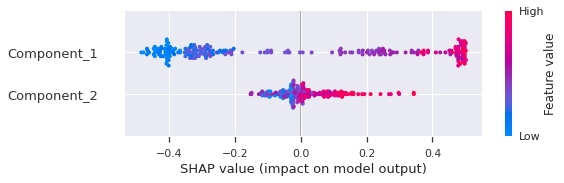

In [166]:
interpret_model(tuned_rf_pca, plot='summary')

### Visualize a single prediction

In [167]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

### Visualize many predictions

In [168]:
interpret_model(tuned_rf_pca, plot='reason')